# KNN

In [109]:
import mglearn
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import matthews_corrcoef

In [131]:
datafile= pd.read_csv("/home/anjali/06/datasets/features.csv")

# print(datafile.keys())
y_cols= ["pepClass"]
x_cols= ['aindex', 'autocovariance', 'autocorrelation', 'BLOSUM1',
       'BLOSUM2', 'BLOSUM3', 'BLOSUM4', 'BLOSUM5', 'BLOSUM6', 'BLOSUM7',
       'BLOSUM8', 'BLOSUM9', 'BLOSUM10', 'boman', 'charge', 'crosscovariance',
       'PP1', 'PP2', 'PP3', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'hmoment',
       'hydrophobicity', 'instaindex', 'KF1', 'KF2', 'KF3', 'KF4', 'KF5',
       'KF6', 'KF7', 'KF8', 'KF9', 'KF10', 'lengthpep', 'MSWHIM1', 'MSWHIM2',
       'MSWHIM3', 'mw', 'pI', 'ProtFP1', 'ProtFP2', 'ProtFP3', 'ProtFP4',
       'ProtFP5', 'ProtFP6', 'ProtFP7', 'ProtFP8', 'ST1', 'ST2', 'ST3', 'ST4',
       'ST5', 'ST6', 'ST7', 'ST8', 'T1', 'T2', 'T3', 'T4', 'T5', 'VHSE1',
       'VHSE2', 'VHSE3', 'VHSE4', 'VHSE5', 'VHSE6', 'VHSE7', 'VHSE8', 'Z1',
       'Z2', 'Z3', 'Z4', 'Z5', 'column_tiny_number', 'column_tiny_percentage',
       'column_Small_number', 'column_Small_percentage',
       'column_Aliphatic_number', 'column_Aliphatic_percentage',
       'column_Aromatic_number', 'column_Aromatic_percentage',
       'column_NonPolar_number', 'column_NonPolar_percentage',
       'column_Polar_number', 'column_Polar_percentage',
       'column_Charged_number', 'column_Charged_percentage',
       'column_Basic_number', 'column_Basic_percentage',
       'column_Acidic_number', 'column_Acidic_percentage']
x_selected= ["column_Acidic_percentage", "PP3"]
X= datafile[x_selected].values
y= datafile[y_cols].values

X=np.nan_to_num(X)
y=np.nan_to_num(y)

y=y.ravel()

In [94]:
X[0:10, 1]

array([ 0.2421212 ,  0.03529412,  0.15944444,  0.14469388, -0.04088235,
        0.1316667 ,  0.1283333 ,  0.27666667,  0.07395349,  0.2113333 ])

In [95]:
X_train, X_test, y_train, y_test= train_test_split(X,y,random_state=0)
clf=KNeighborsClassifier(n_neighbors=1)

clf.fit(X_train, y_train)

print("Test set prediction: {}".format(clf.predict(X_test)))
print("Test set accuracy: {:.2f}". format(clf.score(X_test, y_test)))


Test set prediction: ['AMP' 'AMP' 'AMP' ... 'NAMP' 'NAMP' 'AMP']
Test set accuracy: 0.84


# visualization

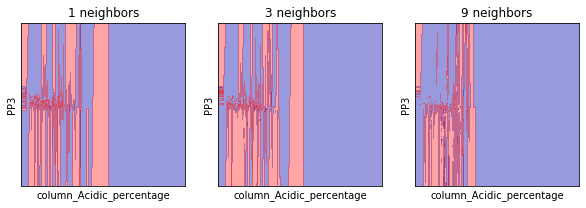

In [96]:
fig, axes= plt.subplots(1,3, figsize=(10,3))

for n_neighbors, ax in zip([1,3,9], axes):
    clf= KNeighborsClassifier(n_neighbors= n_neighbors).fit(X, y)
    mglearn.plots.plot_2d_separator(clf, X_train, fill=True, ax=ax, alpha=0.4)
#     mglearn.discrete_scatter(X[:,0], X[:,1], y, ax= ax)
    ax.set_title("{} neighbors".format(n_neighbors))
    ax.set_xlabel("column_Acidic_percentage")
    ax.set_ylabel("PP3")

# axes[0].legend(loc=3)


# n_neighbors/Accuracy

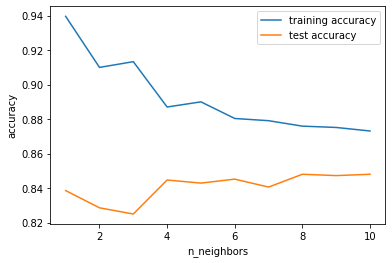

In [97]:
training_accuracy= []
test_accuracy=[]

neighbors_setting= range(1,11)

for n_neighbors in neighbors_setting:
    clf=KNeighborsClassifier(n_neighbors=n_neighbors).fit(X_train, y_train)
    #training set accuracy
    training_accuracy.append(clf.score(X_train, y_train))
    #generalizaton accuracy
    test_accuracy.append(clf.score(X_test, y_test))
    
plt.plot(neighbors_setting, training_accuracy, label= "training accuracy")
plt.plot(neighbors_setting, test_accuracy, label= "test accuracy")
plt.ylabel("accuracy")
plt.xlabel("n_neighbors")
plt.legend()
# plt.show() 

# Training Metrics

In [104]:
y_pred= clf.predict(X_test)
y_true= y_test

results= confusion_matrix(y_actual, y_predict)

print(results)

[[3173  136]
 [ 458  143]]


Confusion matrix, without normalization
[[3173  136]
 [ 458  143]]
Normalized confusion matrix
[[0.96 0.04]
 [0.76 0.24]]


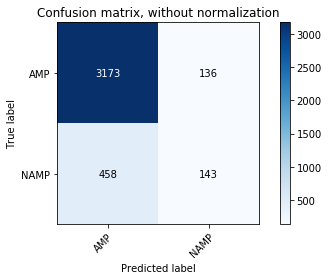

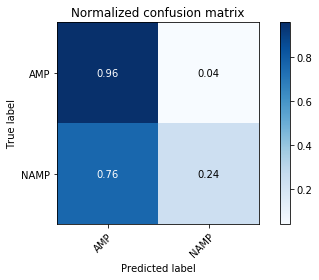

In [112]:
# #import some data to play with
# iris = datasets.load_iris()
# X = iris.data
# y = iris.target
class_names =["AMP", "NAMP"]

# # Split the data into a training set and a test set
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# # Run classifier, using a model that is too regularized (C too low) to see
# # the impact on the results
# classifier = svm.SVC(kernel='linear', C=0.01)
# y_pred = classifier.fit(X_train, y_train).predict(X_test)


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
#     classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True, title='Normalized confusion matrix')

plt.show()

In [110]:
matthews_result= matthews_corrcoef(y_true, y_pred)
matthews_result

0.27578875936963215

# cdhit sequences

In [157]:
cdhit_datafile= pd.read_csv("/home/anjali/06/datasets/cdhit_features.csv")

# print(datafile.keys())
y_cols= ["pepClass"]
x_cols= ['aindex', 'autocovariance', 'autocorrelation', 'BLOSUM1',
       'BLOSUM2', 'BLOSUM3', 'BLOSUM4', 'BLOSUM5', 'BLOSUM6', 'BLOSUM7',
       'BLOSUM8', 'BLOSUM9', 'BLOSUM10', 'boman', 'charge', 'crosscovariance',
       'PP1', 'PP2', 'PP3', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'hmoment',
       'hydrophobicity', 'instaindex', 'KF1', 'KF2', 'KF3', 'KF4', 'KF5',
       'KF6', 'KF7', 'KF8', 'KF9', 'KF10', 'lengthpep', 'MSWHIM1', 'MSWHIM2',
       'MSWHIM3', 'mw', 'pI', 'ProtFP1', 'ProtFP2', 'ProtFP3', 'ProtFP4',
       'ProtFP5', 'ProtFP6', 'ProtFP7', 'ProtFP8', 'ST1', 'ST2', 'ST3', 'ST4',
       'ST5', 'ST6', 'ST7', 'ST8', 'T1', 'T2', 'T3', 'T4', 'T5', 'VHSE1',
       'VHSE2', 'VHSE3', 'VHSE4', 'VHSE5', 'VHSE6', 'VHSE7', 'VHSE8', 'Z1',
       'Z2', 'Z3', 'Z4', 'Z5', 'column_tiny_number', 'column_tiny_percentage',
       'column_Small_number', 'column_Small_percentage',
       'column_Aliphatic_number', 'column_Aliphatic_percentage',
       'column_Aromatic_number', 'column_Aromatic_percentage',
       'column_NonPolar_number', 'column_NonPolar_percentage',
       'column_Polar_number', 'column_Polar_percentage',
       'column_Charged_number', 'column_Charged_percentage',
       'column_Basic_number', 'column_Basic_percentage',
       'column_Acidic_number', 'column_Acidic_percentage']
x_selected= ["column_Acidic_percentage", "PP3"]
X2= cdhit_datafile[x_selected].values
y2= cdhit_datafile[y_cols].values

X2=np.nan_to_num(X2)
y2=np.nan_to_num(y2)

y2=y2.ravel()

In [158]:
X_train2, X_test2, y_train2, y_test2= train_test_split(X2,y2,random_state=0)
clf2=KNeighborsClassifier(n_neighbors=1)

clf2.fit(X_train2, y_train2)

print("Test set prediction: {}".format(clf2.predict(X_test2)))
print("Test set accuracy: {:.2f}". format(clf2.score(X_test2, y_test2)))

Test set prediction: ['AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP'
 'AMP' 'NAMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'NAMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'NAMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP'
 'AMP' 'AMP' 'NAMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'NAMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP'
 'NAMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'NAMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'NAMP' 'AMP'
 'NAMP' 'AMP' 'NAMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'NAMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 

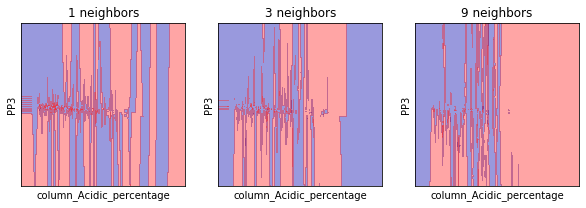

In [159]:
fig2, axes2= plt.subplots(1,3, figsize=(10,3))

for n_neighbors, ax in zip([1,3,9], axes2):
    clf2= KNeighborsClassifier(n_neighbors= n_neighbors).fit(X2, y2)
    mglearn.plots.plot_2d_separator(clf2, X_train2, fill=True, ax=ax, alpha=0.4)
#     mglearn.discrete_scatter(X[:,0], X[:,1], y, ax= ax)
    ax.set_title("{} neighbors".format(n_neighbors))
    ax.set_xlabel("column_Acidic_percentage")
    ax.set_ylabel("PP3")

# axes[0].legend(loc=3)


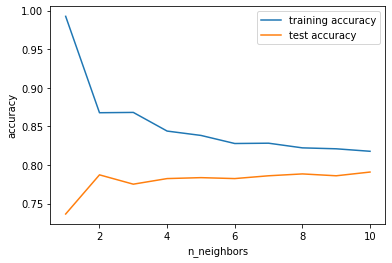

In [170]:
training_accuracy= []
test_accuracy=[]

neighbors_setting= range(1,11)

for n_neighbors in neighbors_setting:
    clf=KNeighborsClassifier(n_neighbors=n_neighbors).fit(X_train2, y_train2)
    #training set accuracy
    training_accuracy.append(clf.score(X_train2, y_train2))
    #generalizaton accuracy
    test_accuracy.append(clf.score(X_test2, y_test2))
    
plt.plot(neighbors_setting, training_accuracy, label= "training accuracy")
plt.plot(neighbors_setting, test_accuracy, label= "test accuracy")
plt.ylabel("accuracy")
plt.xlabel("n_neighbors")
plt.legend()

In [166]:
y_pred2= clf.predict(X_test2)
y_true2= y_test2

results2= confusion_matrix(y_true2, y_pred2)

print(results2)

[[614  27]
 [146  40]]


Confusion matrix, without normalization
[[614  27]
 [146  40]]
Normalized confusion matrix
[[0.96 0.04]
 [0.78 0.22]]


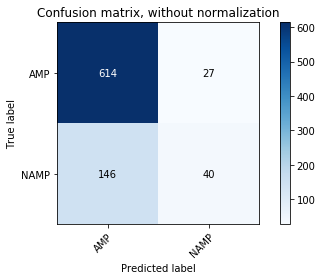

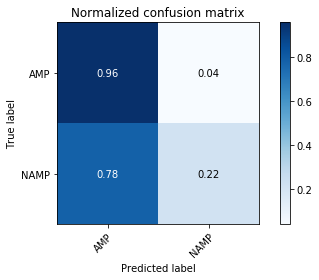

In [167]:
# #import some data to play with
# iris = datasets.load_iris()
# X = iris.data
# y = iris.target
class_names =["AMP", "NAMP"]

# # Split the data into a training set and a test set
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# # Run classifier, using a model that is too regularized (C too low) to see
# # the impact on the results
# classifier = svm.SVC(kernel='linear', C=0.01)
# y_pred = classifier.fit(X_train, y_train).predict(X_test)


def plot_confusion_matrix(y_true2, y_pred2, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true2, y_pred2)
    # Only use the labels that appear in the data
#     classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test2, y_pred2, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test2, y_pred2, classes=class_names, normalize=True, title='Normalized confusion matrix')

plt.show()

# SVC

In [187]:
from sklearn import svm

In [188]:
X
y

array([1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 0])

In [189]:
clf= svm.SVC(kernel= "linear", C=1.0)
clf.fit(X_train,y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [190]:
print(clf.predict(X_test))

['AMP' 'AMP' 'AMP' ... 'AMP' 'AMP' 'AMP']


In [191]:
print("Test set accuracy: {:.2f}". format(clf.score(X_test, y_test)))


Test set accuracy: 0.85


In [192]:
y2_num= list()
for i in range(len(y2)):
    if y2[i]=="AMP":
        y2_num.append(1)
    else:
        y2_num.append(0)
y2_num

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


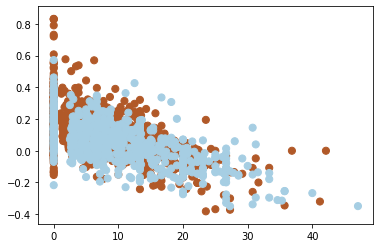

In [193]:
plt.scatter(X2[:,0], X2[:, 1], c=y2_num, s=50, cmap=plt.cm.Paired)

/home/anjali/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: No contour levels were found within the data range.
  app.launch_new_instance()


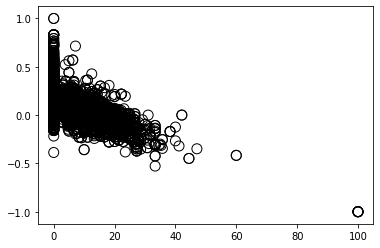

In [194]:

# plot the decision function
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# create grid to evaluate model
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = clf.decision_function(xy).reshape(XX.shape)

# plot decision boundary and margins
ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
           linestyles=['--', '-', '--'])
# plot support vectors
ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='k')
plt.show()

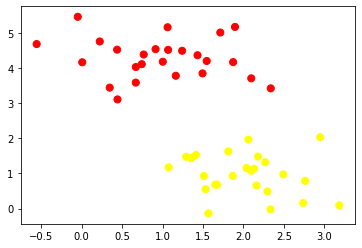

In [182]:


from sklearn.datasets.samples_generator import make_blobs
X, y = make_blobs(n_samples=50, centers=2,
                  random_state=0, cluster_std=0.60)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn');



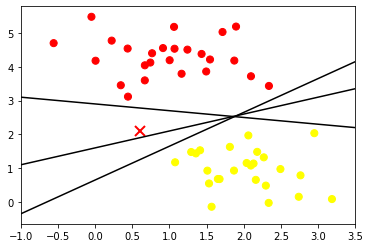

In [184]:


xfit = np.linspace(-1, 3.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plt.plot([0.6], [2.1], 'x', color='red', markeredgewidth=2, markersize=10)

for m, b in [(1, 0.65), (0.5, 1.6), (-0.2, 2.9)]:
    plt.plot(xfit, m * xfit + b, '-k')

plt.xlim(-1, 3.5);





# cdhit sequences

In [173]:
clf2= svm.SVC(kernel= "linear", C=1.0)
clf2.fit(X_train2, y_train2)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [174]:
print(clf2.predict(X_test2))

['AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP'
 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'AMP' 'A

In [175]:
print("Test set accuracy: {:.2f}".format(clf2.score(X_test2, y_test2)))

Test set accuracy: 0.78


# random forest

In [195]:
from sklearn.tree import DecisionTreeClassifier

In [196]:
tree= DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [197]:
print("model accuracy: {:.2f}".format(tree.score(X_test, y_test)))

model accuracy: 0.83


In [199]:
# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)

# Train
model.fit(X_train, y_train)
# Extract single tree
estimator = model.estimators_[5]

feature_names= x_selected
classes=["AMP", "NAMP"]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = classes,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [200]:
from sklearn.ensemble import RandomForestClassifier

model= RandomForestClassifier(n_estimators=1000,
                             bootstrap= True,
                             max_features= 'sqrt')

model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [203]:
#roc_auc score for random forest
rf_predictions= model.predict(X_test)
rf_predictions

array(['AMP', 'AMP', 'AMP', ..., 'NAMP', 'AMP', 'AMP'], dtype=object)

In [205]:
rf_probs= model.predict_proba(X_test)[:,1]
rf_probs

array([0.05, 0.01, 0.08, ..., 0.96, 0.47, 0.04])

In [207]:
from sklearn.metrics import roc_auc_score

roc_value= roc_auc_score(y_test, rf_probs)
roc_value

0.8310781014215756

In [210]:
#roc_auc score for decision tree:
rf_predictions1=tree.predict(X_test)
rf_probs1= tree.predict_proba(X_test)[:, 1]

In [211]:
roc_value1= roc_auc_score(y_test, rf_probs1)
roc_value1

0.7805820258268052